# Paws and Prediction
## Overview of the project
0. Import libraries
1. Load and transform data
2. Visualize data
3. Import model
4. Perform feature analysis of model output

## 0. Import libraries

In [1]:
import torch
from torchvision.datasets import OxfordIIITPet
from torchvision import transforms, datasets, models
from torch.utils.data import DataLoader, random_split
from torchvision.transforms.functional import InterpolationMode
from torchvision.utils import make_grid
import matplotlib.pyplot as plt
import numpy as np
from torch import nn, optim


In [2]:
## for gpu usage, check true
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

print('Using gpu: %s ' % torch.cuda.is_available())

Using gpu: True 


## 1. Load and transform data

We might want to think about how we transform the data and the splitting
Also about the size (now [3, 384, 384]), will probably require a lot of compute to train? Look up what seems reasonable

""The inference transforms are available at EfficientNet_B4_Weights.IMAGENET1K_V1.transforms and perform the following preprocessing operations: Accepts PIL.Image, batched (B, C, H, W) and single (C, H, W) image torch.Tensor objects. The images are resized to resize_size=[384] using interpolation=InterpolationMode.BICUBIC, followed by a central crop of crop_size=[380]. Finally the values are first rescaled to [0.0, 1.0] and then normalized using mean=[0.485, 0.456, 0.406] and std=[0.229, 0.224, 0.225].""


####ser ut som att man kan addera random augmentations :))

def get_train_transform(IMAGE_SIZE, pretrained):
    train_transform = transforms.Compose([
        transforms.Resize((IMAGE_SIZE, IMAGE_SIZE)),
        transforms.RandomHorizontalFlip(p=0.5),
        transforms.GaussianBlur(kernel_size=(5, 9), sigma=(0.1, 5)),
        transforms.RandomAdjustSharpness(sharpness_factor=2, p=0.5),
        transforms.ToTensor(),
        normalize_transform(pretrained)
    ])
    retur

In [3]:
## label dict for the binary dataset
label_dict = {
    0:0, 1:1, 2:1, 3:1, 4: 1, 5:0,
    6:0, 7:0, 8:1, 9:0, 10:1, 11:0, 12:1,
    13:1, 14:1, 15:1, 16:1, 17:1, 18:1,
    19: 1, 20:0, 21:1, 22:1, 23:0, 24:1,
    25:1, 26:0, 27:0, 28:1, 29:1, 30:1,
    31:1, 32:0, 33:0, 34:1, 35:1, 36:1,
}

colormap = 'viridis'
classes = 2

In [4]:
# label dict for the different breeds
label_dict = {
    0: 0, 1: 1, 2: 2, 3: 3, 4: 4, 5: 5,
    6: 6, 7: 7, 8: 8, 9: 9, 10: 10, 11: 11, 12: 12,
    13: 13, 14: 14, 15: 15, 16: 16, 17: 17, 18: 18,
    19: 19, 20: 20, 21: 21, 22: 22, 23: 23, 24: 24,
    25: 25, 26: 26, 27: 27, 28: 28, 29: 29, 30: 30,
    31: 31, 32: 32, 33: 33, 34: 34, 35: 35, 36: 36,
}

colormap = 'viridis'
classes = 37

In [5]:
transform = transforms.Compose([
    transforms.Resize(384, interpolation=InterpolationMode.BICUBIC),
    transforms.CenterCrop(380),
    transforms.ToTensor(),
    #transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])  # Se längst ned på: https://pytorch.org/vision/main/models/generated/torchvision.models.efficientnet_b4.html, är dock inte 100% på att det blev rätt - kolla gärna



class CustomOxfordPets(OxfordIIITPet):
    def __init__(self, *args, label_map=None, **kwargs):
        super().__init__(*args, **kwargs)
        self.label_map = label_map

    def __getitem__(self, index):
        image, target = super().__getitem__(index)
        if int(target) in self.label_map:
            target = self.label_map[target]
        return image, target

dataset_trainval = CustomOxfordPets(root='./data', transform=transform, download=True, label_map=label_dict, split = "trainval") # Bör mappa till 0-1 i labels för hund/katt
test_dataset = CustomOxfordPets(root='./data', transform=transform, download=True, label_map=label_dict, split = "test")

train_size = int(0.7 * len(dataset_trainval))
val_size = len(dataset_trainval)-train_size

train_dataset, val_dataset = random_split(dataset_trainval, [train_size, val_size])

batch_size = 4 #vill vi inte ha större batch size?

train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=True)
test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

100%|██████████| 791918971/791918971 [00:37<00:00, 21316365.96it/s]


Extracting data/oxford-iiit-pet/images.tar.gz to data/oxford-iiit-pet


100%|██████████| 19173078/19173078 [00:01<00:00, 10841411.18it/s]


Extracting data/oxford-iiit-pet/annotations.tar.gz to data/oxford-iiit-pet


In [ ]:
dataset_trainval_37 = OxfordIIITPet(root='./data', transform=transform, download=True, split = "trainval")

## 2. Visualize data
Kolla så att 0,1 labels stämmer \\
OBS: Kommentera bort transforms.Normalize för att bilderna ska se rätt ut och se till att batch_size är relativt liten

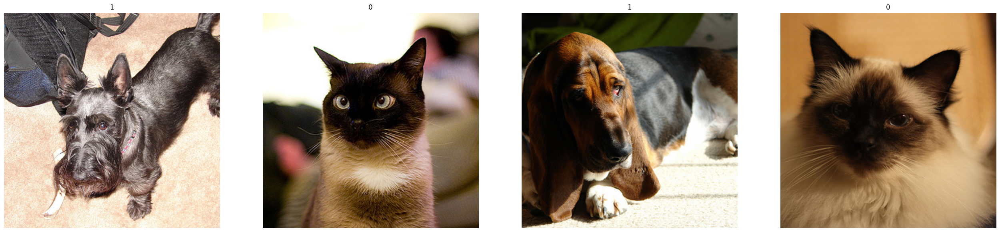

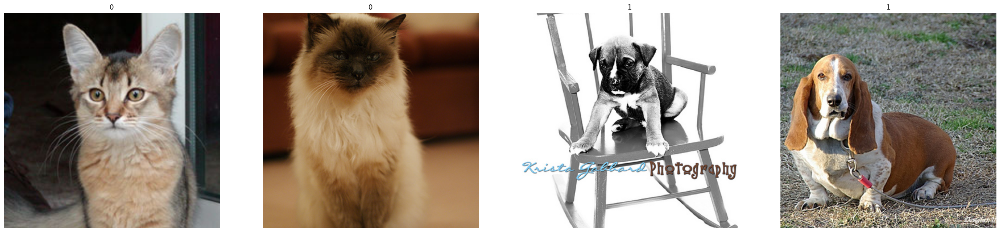

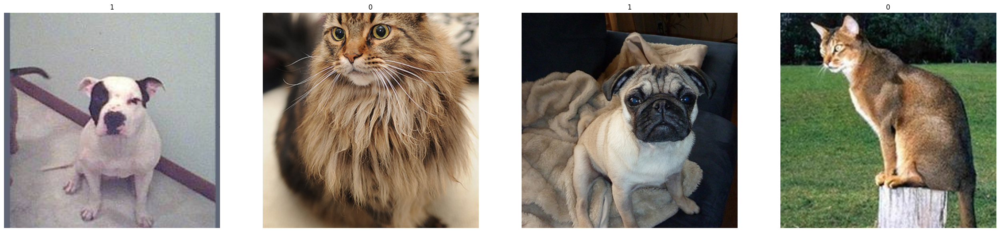

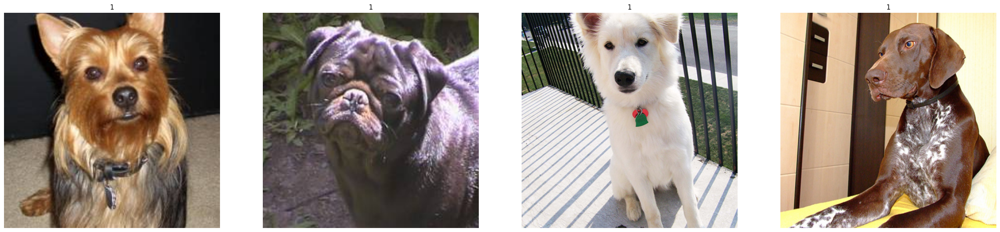

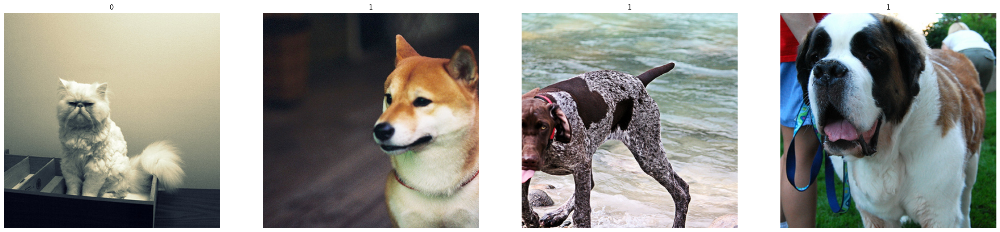

In [ ]:
def show_images(images, labels, nmax=4):
    fig, axs = plt.subplots(1, nmax, figsize=(32, 32))
    for i, (image, label) in enumerate(zip(images, labels)):
        if i == nmax:
            print(i)
            break
        axs[i].imshow(image.permute(1, 2, 0))
        ''' if int(label) in label_dict and False: #OBS
          axs[i].set_title(f'{label_dict[int(label)]}')
        else: '''
        axs[i].set_title(f'{label}')
        axs[i].axis('off')
    plt.show()

counter = 0
for images, labels in train_loader:
    show_images(images, labels, nmax=batch_size)
    counter += 1
    if counter == 5:
      break


## 3. Import model

In [7]:
model_b4 = models.efficientnet_b4(weights = models.EfficientNet_B4_Weights.IMAGENET1K_V1)

for param in model_b4.parameters(): #Freeze
    param.requires_grad = False

num_features = model_b4.classifier[1].in_features #how to decide what layer?
print(num_features)
# Replace the classifier layer
#model_b4.classifier[1] = nn.Linear(num_features, 1) varför inte [1]
model_b4.classifier = torch.nn.Identity()

Downloading: "https://download.pytorch.org/models/efficientnet_b4_rwightman-23ab8bcd.pth" to /root/.cache/torch/hub/checkpoints/efficientnet_b4_rwightman-23ab8bcd.pth
100%|██████████| 74.5M/74.5M [00:00<00:00, 147MB/s]


1792


## 4. Perform feature analysis on model

### a) load parts of training data
Load the data into vectors X = feature_data and y = labels_data so we can perform some analysis on them \\

**Model input:** [bs, channels, height, width] (maybe [width, hwght], with channels=3, the three color channels) \\
**Model Output** [bs, 1000] (feature vector of 1000)

In [8]:
model_b4.to(device)
model_b4.eval()

batch_size = 100
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)

feature_data = []
labels_data = []
for i, (data, label) in enumerate(train_loader):
    print(i)
    data = data.to(device)  # Move data to GPU
    with torch.no_grad():
      features = model_b4(data).cpu().detach().numpy()
    feature_data.extend(features)
    labels_data.extend(label)
'''
    if i == 10:
      break '''

labels_data_np = np.array([label.item() for label in labels_data]) # for later


0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25


In [ ]:
print(model_b4)

### b) Perform PCA and study the components
Visualize explained variance ratio of each component \\
We see that they seem to not explain too much, about 50 components to have 70% of the data explained

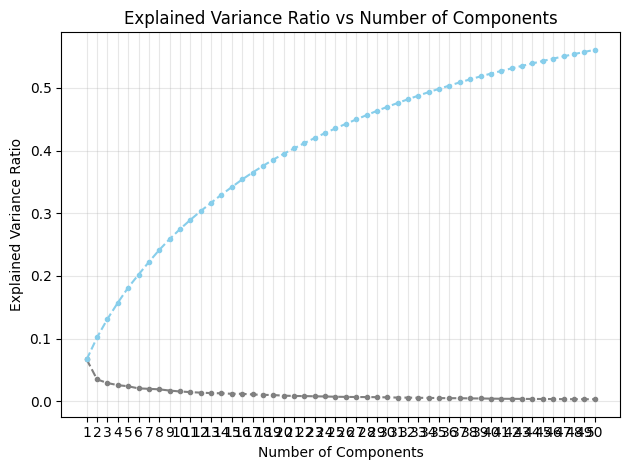

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA

# Perform PCA with different number of components
n = 50
n_components = np.arange(1, n+1)  # Try with 1 to 10 components
explained_variance_ratio_individual = []
explained_variance_ratio_cumulative = []

pca = PCA(n_components=n)
pca.fit(feature_data)

explained_variance_ratio_individual = pca.explained_variance_ratio_
explained_variance_ratio_cumulative = np.cumsum(pca.explained_variance_ratio_)

# Plot cumulative explained variance ratio
plt.plot(n_components, explained_variance_ratio_individual, marker='.', color='grey', linestyle='--')
# Plot cumulative explained variance ratio
plt.plot(n_components, explained_variance_ratio_cumulative, marker='.', color='skyblue', linestyle='--')

plt.xlabel('Number of Components')
plt.ylabel('Explained Variance Ratio')
plt.title('Explained Variance Ratio vs Number of Components')
plt.grid(True, alpha=0.3)
plt.xticks(n_components)
plt.tight_layout()
plt.show()

### c) Perform kmeans clustering
Study the kmeans clustering \\
For model b4 and non-normalized images we get about 85-88% accuracy.

In [ ]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import accuracy_score

knn = KNeighborsClassifier(n_neighbors=2)
knn.fit(feature_data[:-40], labels_data[:-40])

y_pred = knn.predict(feature_data[-40:])

# Calculate accuracy
accuracy = accuracy_score(labels_data[-40:], y_pred)
print("Accuracy:", accuracy)

Accuracy: 0.925


In [ ]:
print(y_pred[0:20])
print(labels_data_np[0:20])

[18 18 31 29 21 20 16  7  8 26 32 19 28 36 12 13  8 15 30 12]
[26 13 32 26 17 18 30  5 30 30 23 22 25 17  8 11  9 21 26 20]


### d) Trying out tSNE, PCA and UMAP to visualize the clusters

i) tSNE - seems to cluster alright

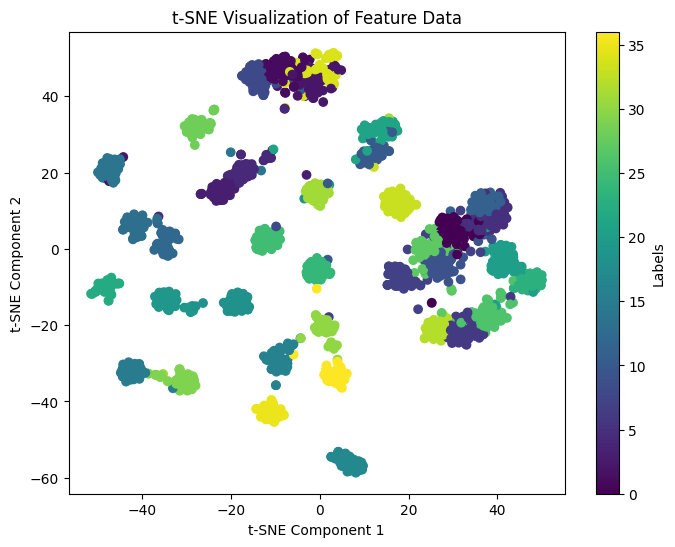

In [9]:
from sklearn.manifold import TSNE

# Convert feature_data to a NumPy array
feature_data_array = np.array(feature_data)

# Instantiate t-SNE with 2 components
tsne = TSNE(n_components=2)

# Transform the feature data
transformed_data_tsne = tsne.fit_transform(feature_data_array)

# Visualize the transformed data
plt.figure(figsize=(8, 6))
plt.scatter(transformed_data_tsne[:, 0], transformed_data_tsne[:, 1], c=labels_data, cmap=colormap)
plt.colorbar(label='Labels')
plt.xlabel('t-SNE Component 1')
plt.ylabel('t-SNE Component 2')
plt.title('t-SNE Visualization of Feature Data')
plt.show()


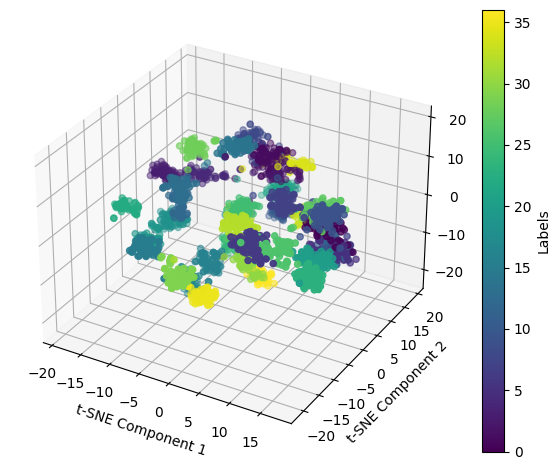

In [14]:
from sklearn.manifold import TSNE

# Convert feature_data to a NumPy array
feature_data_array = np.array(feature_data)

# Instantiate t-SNE with 3 components
tsne = TSNE(n_components=3)

# Transform the feature data
#transformed_data_tsne = tsne.fit_transform(feature_data_array)

fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')

# Scatter plot of transformed data


scatter = ax.scatter(transformed_data_tsne[:, 0], transformed_data_tsne[:, 1],transformed_data_tsne[:, 2], c=labels_data, cmap=colormap)
plt.colorbar(scatter, label='Labels')
#plt.colorbar(label='Labels')
ax.set_xlabel('t-SNE Component 1')
ax.set_ylabel('t-SNE Component 2')
#ax.set_zlabel('t-SNE Component 3')
plt.tight_layout()

#plt.title('t-SNE Visualization of Feature Data')
plt.show()

ii) UMAP visualizing - not sure if the implementation is correct, did it through chatGPT

In [ ]:
!pip install umap-learn

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 85.7/85.7 kB 1.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.8/56.8 kB 3.7 MB/s eta 0:00:00


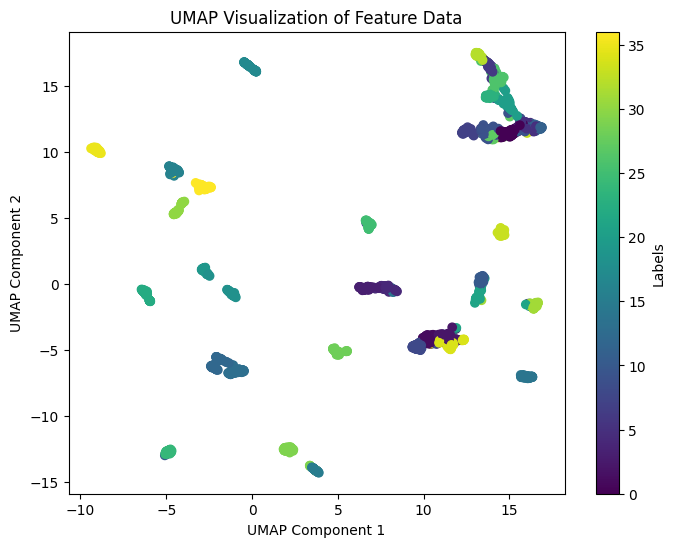

In [ ]:
import umap.umap_ as umap
import numpy as np

# Convert feature_data to a NumPy array
feature_data_array = np.array(feature_data)

# Instantiate UMAP with 2 components
umap_model = umap.UMAP(n_components=2)

# Transform the feature data
transformed_data_umap = umap_model.fit_transform(feature_data_array)

# Visualize the transformed data
plt.figure(figsize=(8, 6))
plt.scatter(transformed_data_umap[:, 0], transformed_data_umap[:, 1], c=labels_data, cmap=colormap)
plt.colorbar(label='Labels')
plt.xlabel('UMAP Component 1')
plt.ylabel('UMAP Component 2')
plt.title('UMAP Visualization of Feature Data')
plt.show()


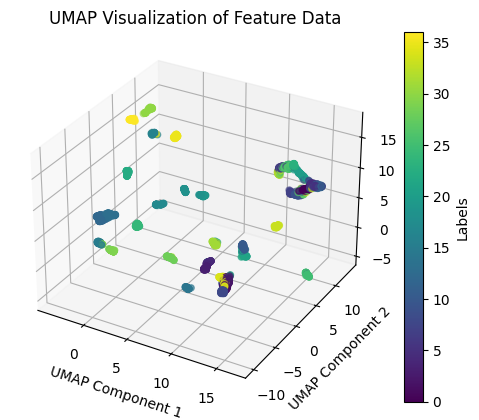

In [ ]:
import umap.umap_ as umap
import numpy as np

# Convert feature_data to a NumPy array
feature_data_array = np.array(feature_data)

# Instantiate UMAP with 2 components
umap_model = umap.UMAP(n_components=3)

# Transform the feature data
transformed_data_umap = umap_model.fit_transform(feature_data_array)

# Visualize the transformed data
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')

# Scatter plot of transformed data


scatter = ax.scatter(transformed_data_umap[:, 0], transformed_data_umap[:, 1],transformed_data_umap[:, 2], c=labels_data, cmap=colormap)
plt.colorbar(scatter, label='Labels')
#plt.colorbar(label='Labels')
ax.set_xlabel('UMAP Component 1')
ax.set_ylabel('UMAP Component 2')
ax.set_zlabel('UMAP Component 3')
plt.title('UMAP Visualization of Feature Data')
plt.show()


iii) PCA

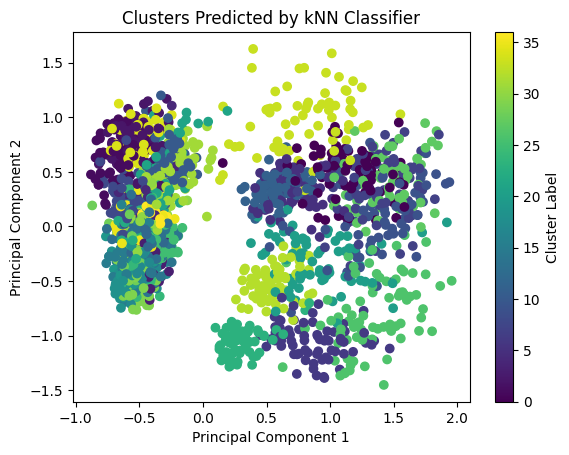

In [ ]:
import matplotlib.pyplot as plt

# Perform PCA with 3 components
pca = PCA(n_components=3)
pca.fit(feature_data)
transformed_data = pca.transform(feature_data)

# Plot the clusters
plt.scatter(transformed_data[:, 0], transformed_data[:, 1], c=labels_data, cmap=colormap)
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.title('Clusters Predicted by kNN Classifier')
plt.colorbar(label='Cluster Label')
plt.show()


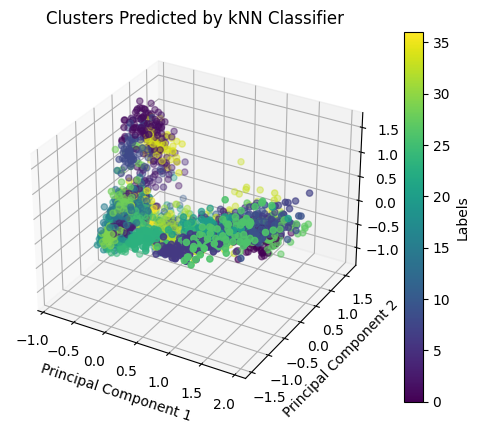

In [ ]:
import numpy as np
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D  # Importing 3D plotting library

# Visualize the transformed data in 3D
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')

# Scatter plot of transformed data
scatter = ax.scatter(transformed_data[:, 0], transformed_data[:, 1], transformed_data[:, 2], c=labels_data, cmap=colormap)
plt.colorbar(scatter, label='Labels')

ax.set_xlabel('Principal Component 1')
ax.set_ylabel('Principal Component 2')
ax.set_zlabel('Principal Component 3')
ax.set_title('Clusters Predicted by kNN Classifier')

plt.show()